In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his_88params/')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-24582.2206148 ]
 [-24582.2206148 ]
 [-24582.2206148 ]
 ..., 
 [   151.30220851]
 [   151.30220851]
 [   151.30220851]]
Logp of trace:  a  chain:  1  =  [ 150.2213512]
Logp of trace:  a  chain:  2  =  [ 151.81424414]
Logp of trace:  b  chain: 0 =  [[-1915.68001524]
 [-1874.57317832]
 [-1219.66838473]
 ..., 
 [  151.49225881]
 [  151.49225881]
 [  151.49225881]]
Logp of trace:  b  chain:  1  =  [ 152.62520832]
Logp of trace:  b  chain:  2  =  [ 151.58346572]
Logp of trace:  c  chain: 0 =  [[-1493.3308628 ]
 [-1493.3308628 ]
 [-1438.26990206]
 ..., 
 [  153.79048405]
 [  153.79048405]
 [  153.79048405]]
Logp of trace:  c  chain:  1  =  [ 152.49858615]
Logp of trace:  c  chain:  2  =  [ 151.99531024]
Logp of trace:  d  chain: 0 =  [[-6282.79218782]
 [-4843.40038088]
 [-4132.77578341]
 ..., 
 [  150.76843262]
 [  150.76843262]
 [  150.76843262]]
Logp of trace:  d  chain:  1  =  [ 152.87397837]
Logp of trace:  d  chain:  2  =  [ 146.74746962]


In [20]:
traces['a'][0][:,72]

array([-1.28589848, -1.28589848, -1.28589848, ..., -2.54246617,
       -2.54246617, -2.54246617])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  72  of  88  parameters.
Percent of parameters with GR below 1.2:  81.8181818182
Number of parameters with GR below 1.1:  49  of  88  parameters.
Percent of parameters with GR below 1.1:  55.6818181818


[72, 81.81818181818183, 49, 55.68181818181818]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  80  of  88  parameters.
Percent of parameters with GR below 1.2:  90.9090909091
Number of parameters with GR below 1.1:  61  of  88  parameters.
Percent of parameters with GR below 1.1:  69.3181818182


[80, 90.9090909090909, 61, 69.31818181818183]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  63  of  88  parameters.
Percent of parameters with GR below 1.2:  71.5909090909
Number of parameters with GR below 1.1:  38  of  88  parameters.
Percent of parameters with GR below 1.1:  43.1818181818


[63, 71.5909090909091, 38, 43.18181818181818]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  78  of  88  parameters.
Percent of parameters with GR below 1.2:  88.6363636364
Number of parameters with GR below 1.1:  54  of  88  parameters.
Percent of parameters with GR below 1.1:  61.3636363636


[78, 88.63636363636364, 54, 61.36363636363637]

50000
3
50000


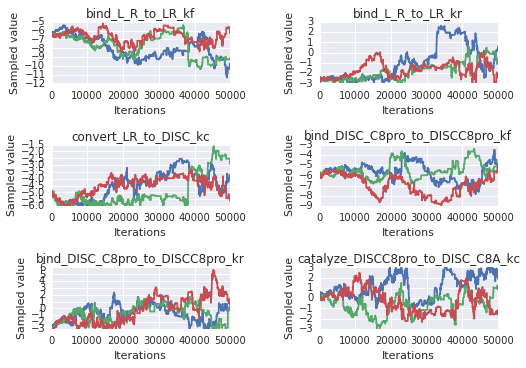

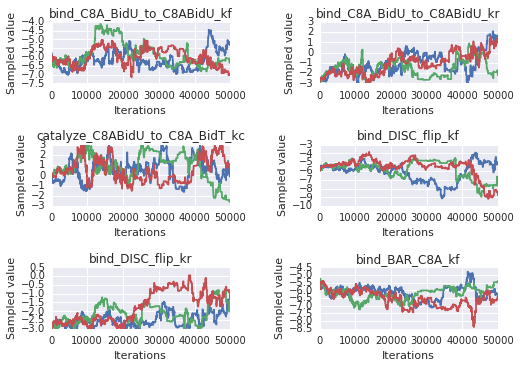

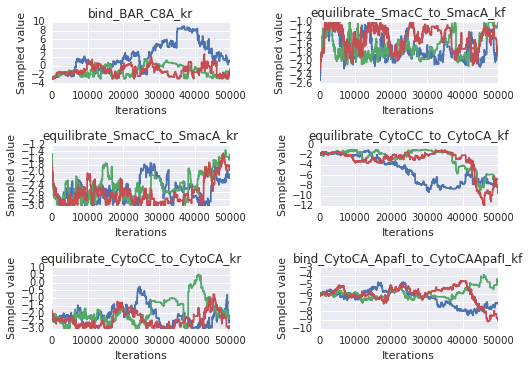

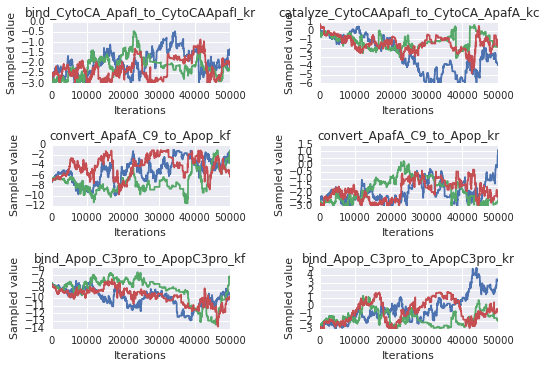

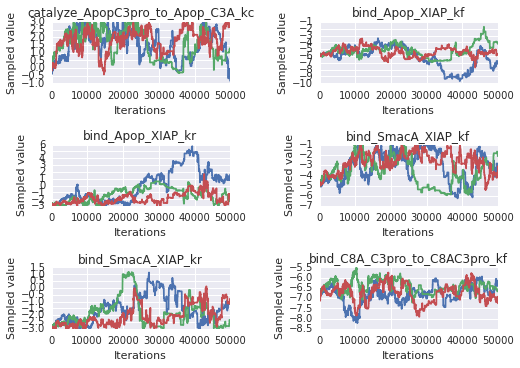

...

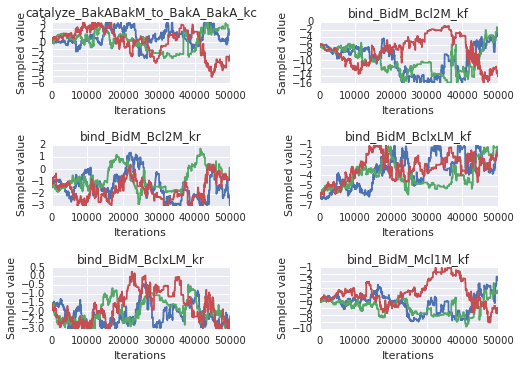

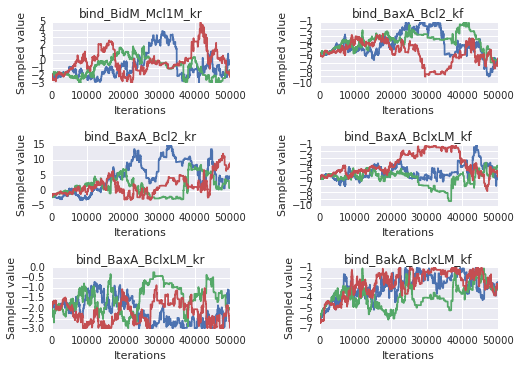

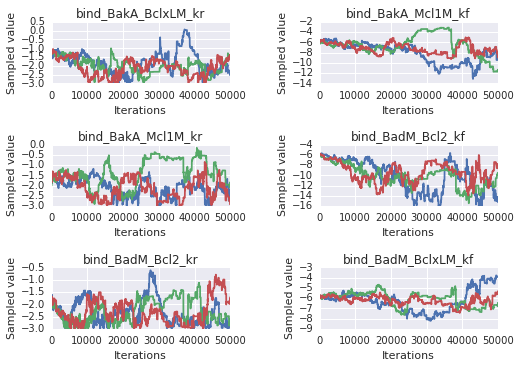

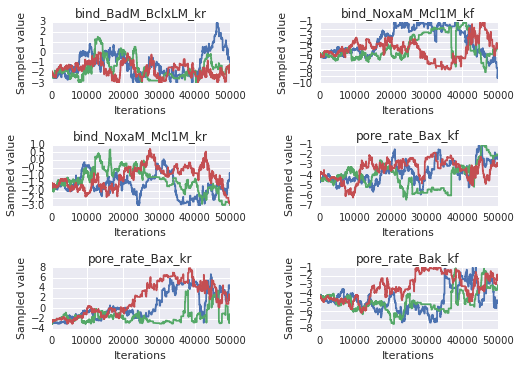

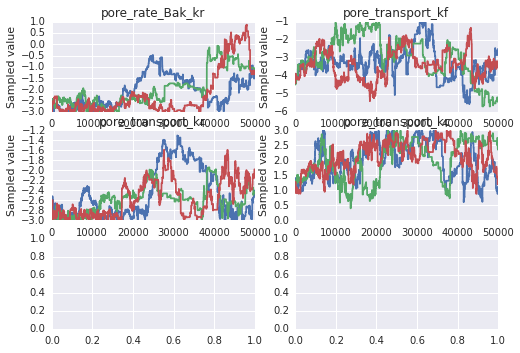

In [11]:
sample_plots(param_trace_dicts['a'])

In [12]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


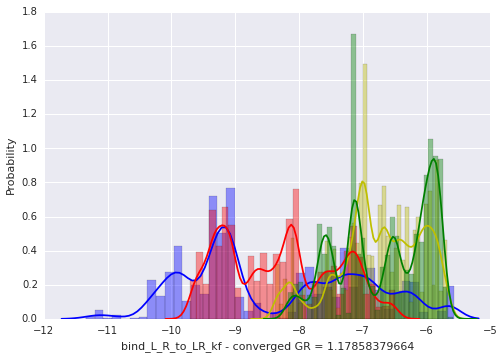

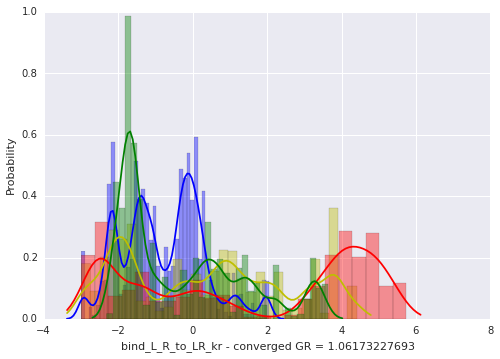

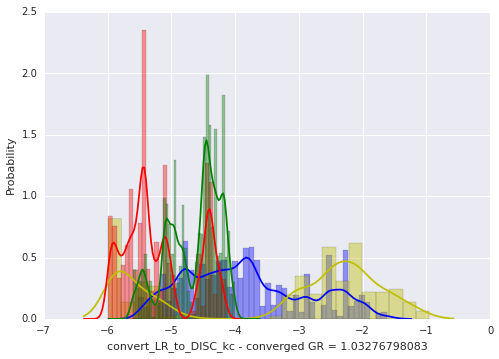

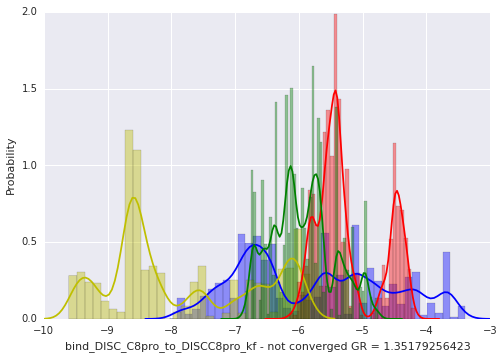

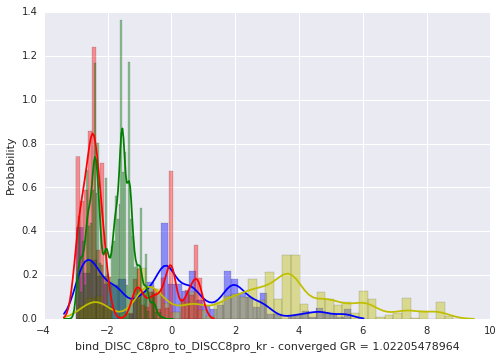

...

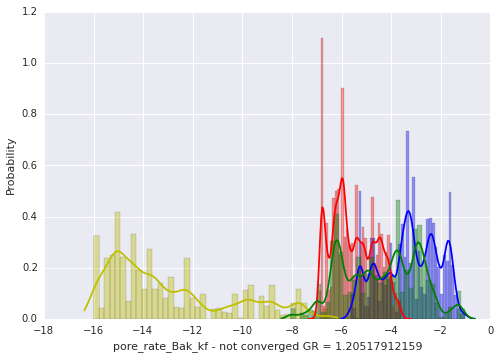

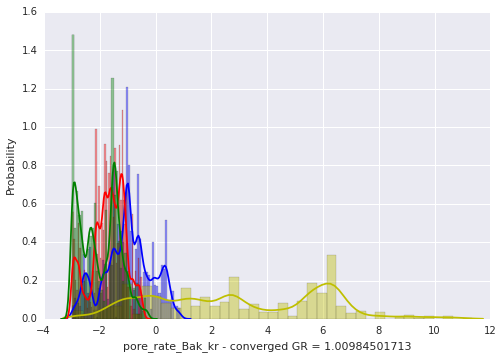

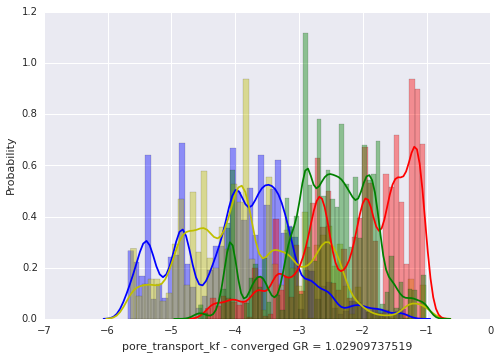

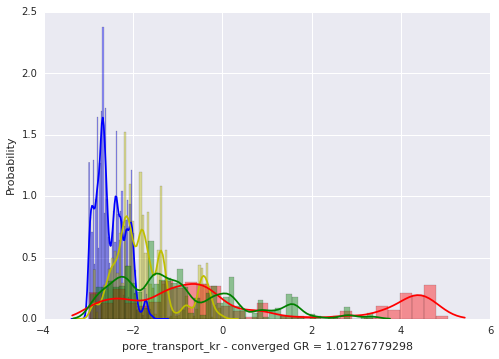

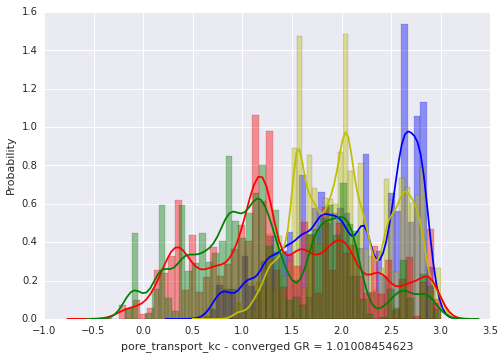

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.23852072, -6.23852072, -6.27159628, ..., -9.14126896,
       -9.14126896, -9.14126896])

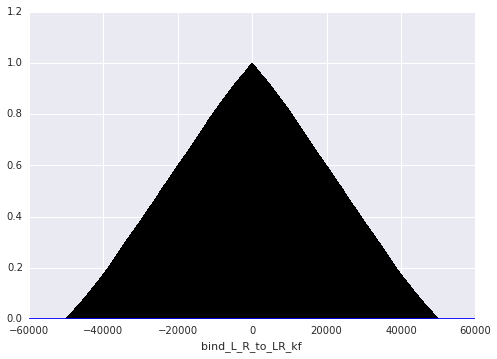

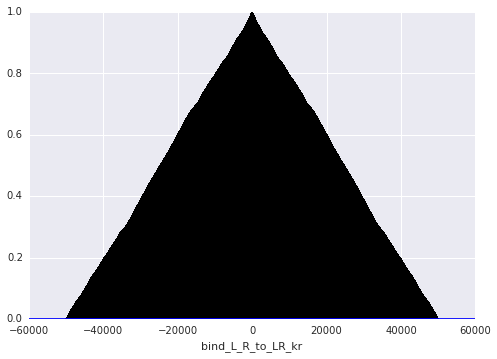

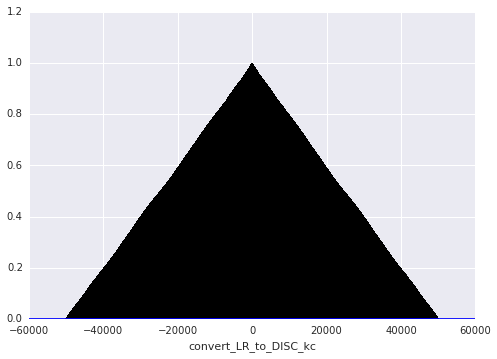

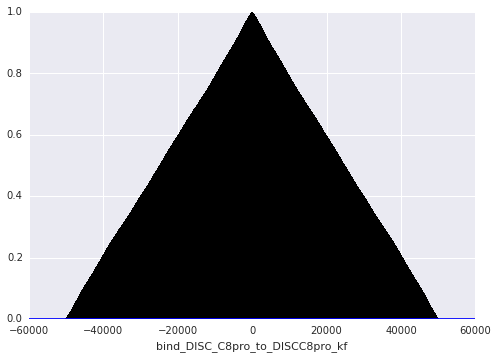

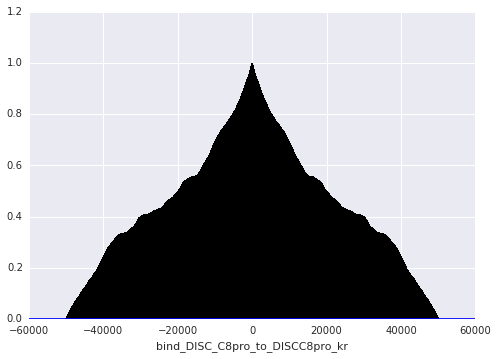

...

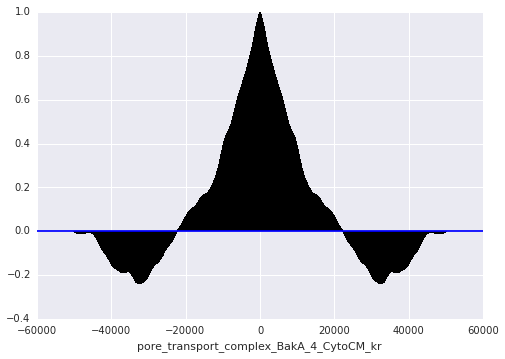

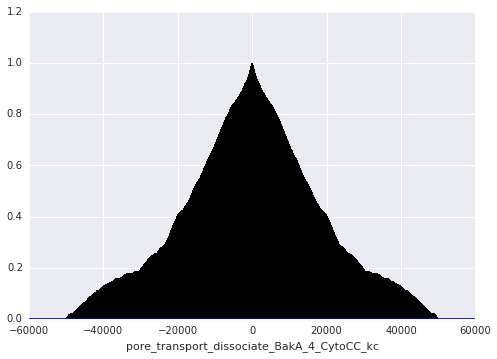

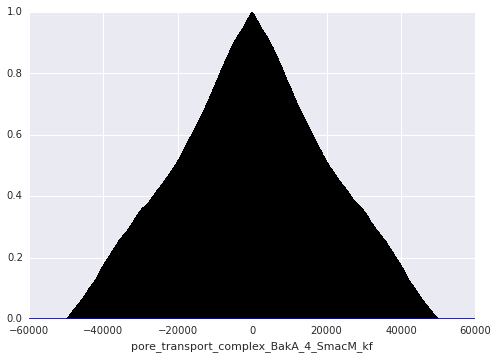

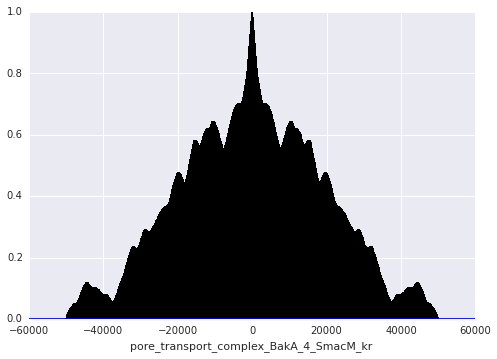

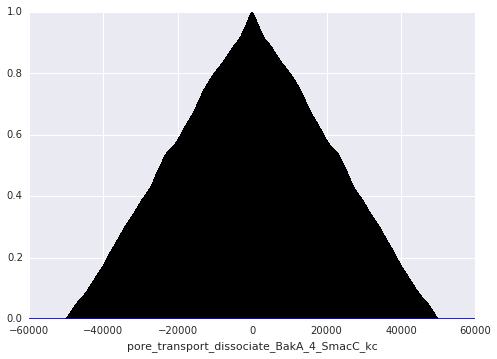

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

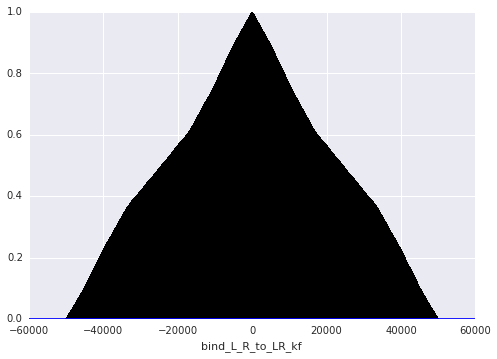

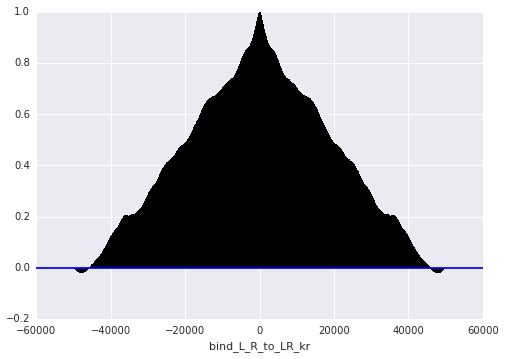

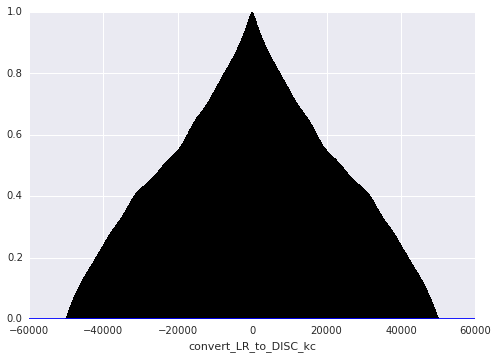

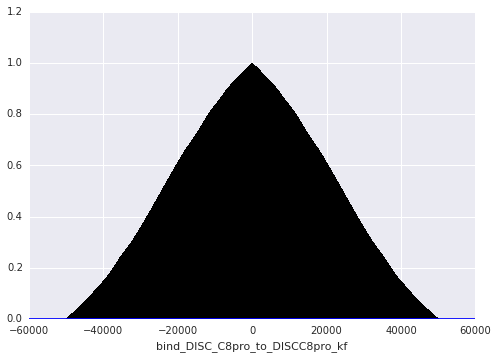

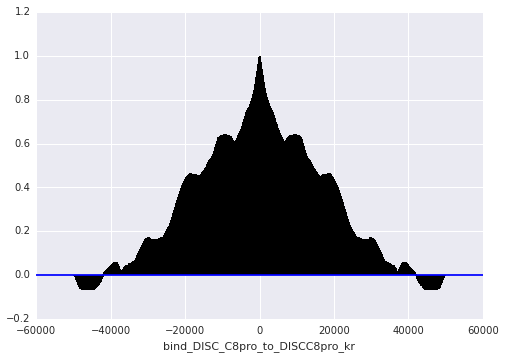

...

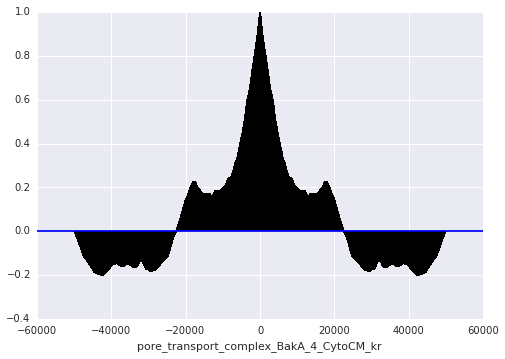

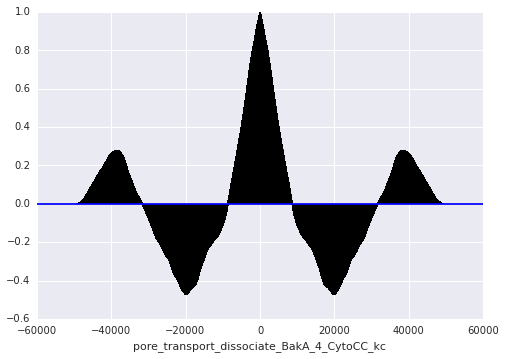

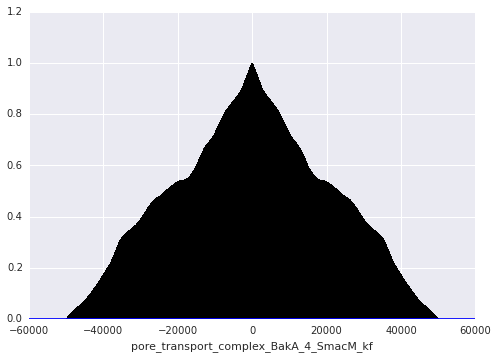

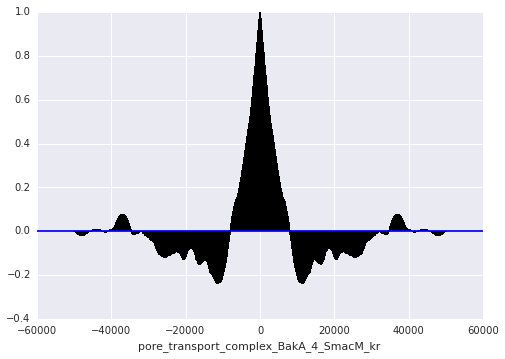

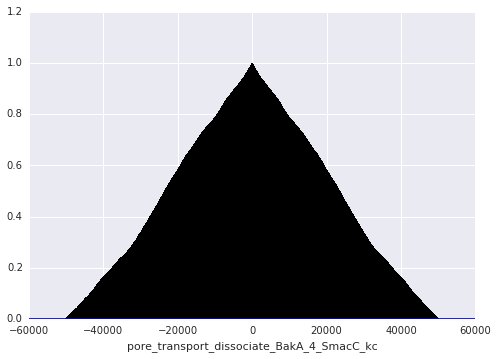

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

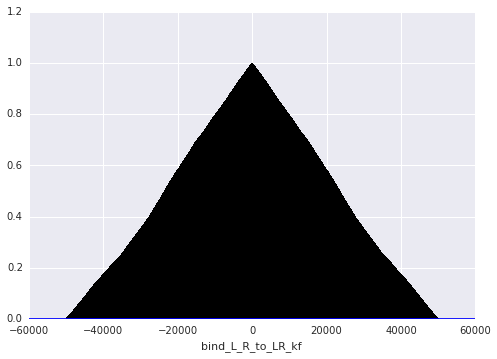

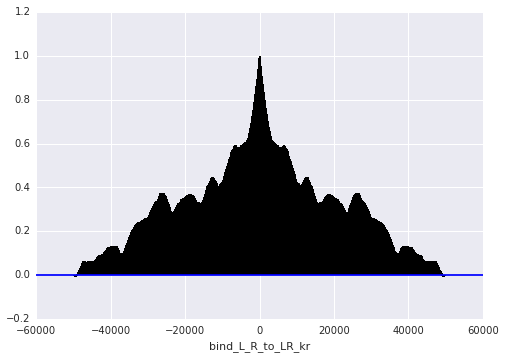

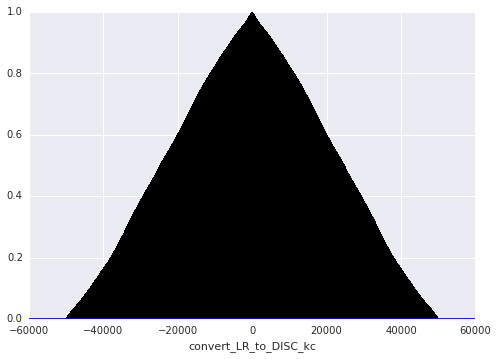

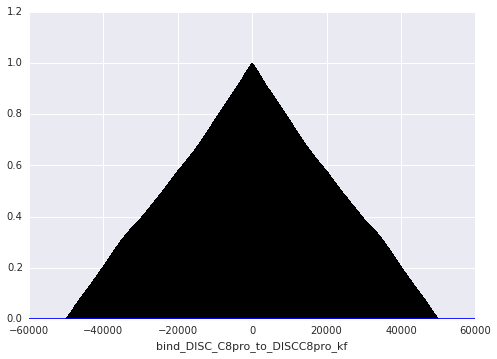

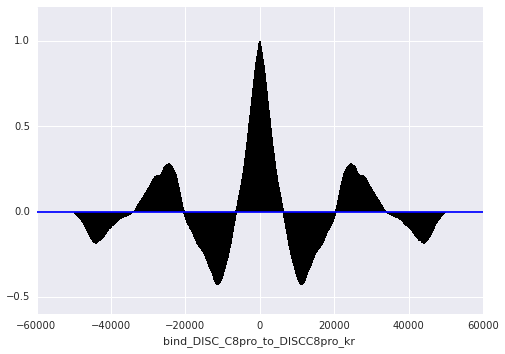

...

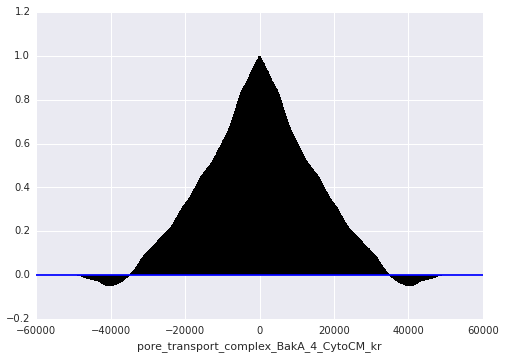

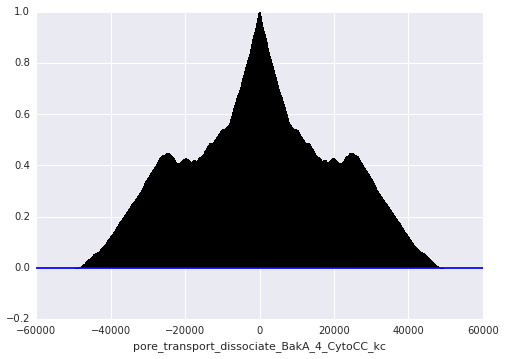

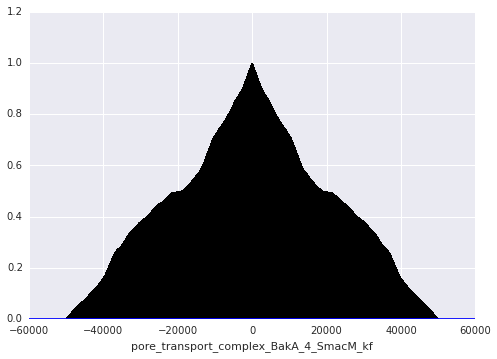

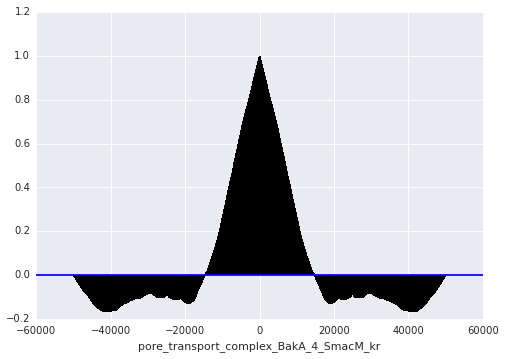

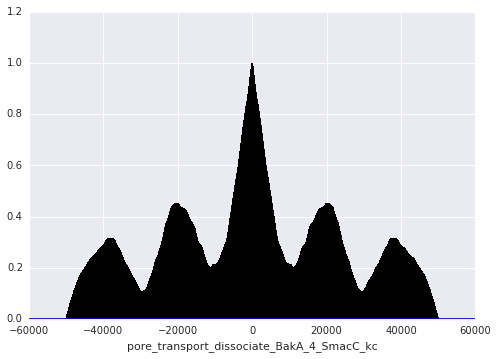

In [23]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [15]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1254  acceptance rate:  0.02508
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1296  acceptance rate:  0.02592
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1241  acceptance rate:  0.02482
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1258  acceptance rate:  0.02516
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1321  acceptance rate:  0.02642
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1298  acceptance rate:  0.02596
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1228  acceptance rate:  0.02456
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1289  acceptance rate:  0.02578
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1311  acceptance rate:  0.02622
N acceptances for parameter:  bind_DISC_flip_kf  =  1278  acceptance rate:  0.02556
N acceptances for parameter:  bind_DISC_flip_kr  =  1296  acceptance rate:  0.

array([ 0.02508,  0.02592,  0.02482,  0.02516,  0.02642,  0.02596,
        0.02456,  0.02578,  0.02622,  0.02556,  0.02592,  0.02486,
        0.02602,  0.02574,  0.0259 ,  0.02554,  0.02612,  0.0258 ,
        0.02556,  0.02564,  0.0257 ,  0.02536,  0.02586,  0.02532,
        0.0257 ,  0.02516,  0.02604,  0.02598,  0.02596,  0.02442,
        0.02572,  0.02624,  0.02468,  0.02556,  0.0254 ,  0.02584,
        0.02558,  0.02544,  0.02492,  0.0258 ,  0.02522,  0.02512,
        0.02602,  0.02552,  0.026  ,  0.02568,  0.02568,  0.02604,
        0.02542,  0.02574,  0.02634,  0.02586,  0.02452,  0.02596,
        0.02574,  0.02564,  0.02574,  0.02606,  0.02622,  0.02604,
        0.02566,  0.02592,  0.02564,  0.02592,  0.02516,  0.02616,
        0.02592,  0.02548,  0.0258 ,  0.02556,  0.02528,  0.02576,
        0.02624,  0.02632,  0.02608,  0.02594,  0.02602,  0.02546,
        0.02618,  0.02548,  0.0257 ,  0.02628,  0.02556,  0.02594,
        0.02566,  0.02592,  0.02592,  0.02648])

In [16]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1082  acceptance rate:  0.02164
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1104  acceptance rate:  0.02208
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1086  acceptance rate:  0.02172
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1064  acceptance rate:  0.02128
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1114  acceptance rate:  0.02228
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1102  acceptance rate:  0.02204
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1057  acceptance rate:  0.02114
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1106  acceptance rate:  0.02212
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1117  acceptance rate:  0.02234
N acceptances for parameter:  bind_DISC_flip_kf  =  1117  acceptance rate:  0.02234
N acceptances for parameter:  bind_DISC_flip_kr  =  1109  acceptance rate:  0.

array([ 0.02164,  0.02208,  0.02172,  0.02128,  0.02228,  0.02204,
        0.02114,  0.02212,  0.02234,  0.02234,  0.02218,  0.02172,
        0.02258,  0.02108,  0.02212,  0.02208,  0.02218,  0.02222,
        0.02206,  0.0216 ,  0.0215 ,  0.022  ,  0.02148,  0.02206,
        0.02248,  0.02188,  0.0224 ,  0.02242,  0.02234,  0.02118,
        0.02184,  0.02156,  0.02114,  0.02232,  0.02206,  0.022  ,
        0.02234,  0.02226,  0.02168,  0.0221 ,  0.02236,  0.02166,
        0.02216,  0.02202,  0.0219 ,  0.02206,  0.02258,  0.02194,
        0.02218,  0.02252,  0.02138,  0.02156,  0.02112,  0.02132,
        0.02256,  0.02242,  0.02204,  0.02246,  0.0218 ,  0.0222 ,
        0.02228,  0.0224 ,  0.02214,  0.02164,  0.02186,  0.02178,
        0.02184,  0.02172,  0.02236,  0.02282,  0.02232,  0.02224,
        0.0222 ,  0.0216 ,  0.02204,  0.02238,  0.02204,  0.02246,
        0.02152,  0.02178,  0.02252,  0.022  ,  0.02228,  0.0221 ,
        0.0225 ,  0.02198,  0.0226 ,  0.02206])

In [17]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1144  acceptance rate:  0.02288
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1195  acceptance rate:  0.0239
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1145  acceptance rate:  0.0229
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1168  acceptance rate:  0.02336
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1202  acceptance rate:  0.02404
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1198  acceptance rate:  0.02396
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1174  acceptance rate:  0.02348
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1194  acceptance rate:  0.02388
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1187  acceptance rate:  0.02374
N acceptances for parameter:  bind_DISC_flip_kf  =  1155  acceptance rate:  0.0231
N acceptances for parameter:  bind_DISC_flip_kr  =  1194  acceptance rate:  0.023

array([ 0.02288,  0.0239 ,  0.0229 ,  0.02336,  0.02404,  0.02396,
        0.02348,  0.02388,  0.02374,  0.0231 ,  0.02388,  0.02292,
        0.0245 ,  0.0241 ,  0.02378,  0.02404,  0.02346,  0.02356,
        0.0237 ,  0.02344,  0.02322,  0.02426,  0.02358,  0.02352,
        0.0241 ,  0.02376,  0.0241 ,  0.02372,  0.02344,  0.02276,
        0.02414,  0.02324,  0.02238,  0.02328,  0.02384,  0.02364,
        0.02406,  0.02378,  0.023  ,  0.02446,  0.02398,  0.02316,
        0.02426,  0.0237 ,  0.02384,  0.02362,  0.02368,  0.0235 ,
        0.02418,  0.02332,  0.024  ,  0.02394,  0.02332,  0.0239 ,
        0.02374,  0.02322,  0.02398,  0.02358,  0.02388,  0.02388,
        0.02332,  0.02368,  0.02366,  0.0234 ,  0.02416,  0.02356,
        0.0234 ,  0.02368,  0.0241 ,  0.02406,  0.02418,  0.0242 ,
        0.02366,  0.02388,  0.02388,  0.02422,  0.02354,  0.02402,
        0.02422,  0.02376,  0.02404,  0.02324,  0.0242 ,  0.02376,
        0.02386,  0.02424,  0.02402,  0.02374])

In [18]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1144  acceptance rate:  0.02288
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1195  acceptance rate:  0.0239
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1145  acceptance rate:  0.0229
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1168  acceptance rate:  0.02336
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1202  acceptance rate:  0.02404
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1198  acceptance rate:  0.02396
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1174  acceptance rate:  0.02348
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1194  acceptance rate:  0.02388
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1187  acceptance rate:  0.02374
N acceptances for parameter:  bind_DISC_flip_kf  =  1155  acceptance rate:  0.0231
N acceptances for parameter:  bind_DISC_flip_kr  =  1194  acceptance rate:  0.023

array([ 0.02288,  0.0239 ,  0.0229 ,  0.02336,  0.02404,  0.02396,
        0.02348,  0.02388,  0.02374,  0.0231 ,  0.02388,  0.02292,
        0.0245 ,  0.0241 ,  0.02378,  0.02404,  0.02346,  0.02356,
        0.0237 ,  0.02344,  0.02322,  0.02426,  0.02358,  0.02352,
        0.0241 ,  0.02376,  0.0241 ,  0.02372,  0.02344,  0.02276,
        0.02414,  0.02324,  0.02238,  0.02328,  0.02384,  0.02364,
        0.02406,  0.02378,  0.023  ,  0.02446,  0.02398,  0.02316,
        0.02426,  0.0237 ,  0.02384,  0.02362,  0.02368,  0.0235 ,
        0.02418,  0.02332,  0.024  ,  0.02394,  0.02332,  0.0239 ,
        0.02374,  0.02322,  0.02398,  0.02358,  0.02388,  0.02388,
        0.02332,  0.02368,  0.02366,  0.0234 ,  0.02416,  0.02356,
        0.0234 ,  0.02368,  0.0241 ,  0.02406,  0.02418,  0.0242 ,
        0.02366,  0.02388,  0.02388,  0.02422,  0.02354,  0.02402,
        0.02422,  0.02376,  0.02404,  0.02324,  0.0242 ,  0.02376,
        0.02386,  0.02424,  0.02402,  0.02374])